## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

In [1]:
# import modules

import cv2
import glob
import numpy as np
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import importlib
%matplotlib inline

## 1. Compute the camera calibration using chessboard images

In [2]:
def calc_points(images_name):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob(images_name)

    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            #img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            #cv2.imshow('img',img)
            #cv2.waitKey(500)

    #cv2.destroyAllWindows()
    return objpoints,imgpoints


## 2. Undistort a test image

In [3]:
def undistort_image(img,objpoints,imgpoints):
    
    #convert image to gray scale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

    #compute the camera calibration matrix and distortion coefficients
    ret,mtx,dist,rvecs,tvecs = cv2.calibrateCamera(objpoints,imgpoints,gray.shape[::-1],None,None)

    #distortion correction
    dst_img = cv2.undistort(img,mtx,dist,None,mtx)
    
    return dst_img


def plot_compare_black(ori_img, res_img):
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(ori_img)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(res_img, cmap= 'gray')
    ax2.set_title('Result Image', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
def plot_compare_color(ori_img, res_img):
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(ori_img)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(res_img)
    ax2.set_title('Result Image', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

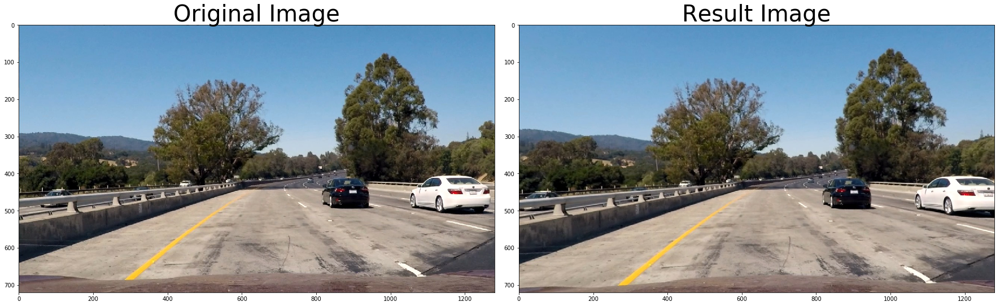

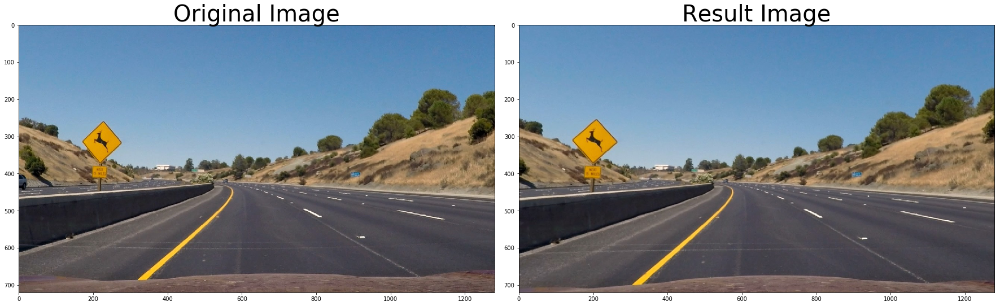

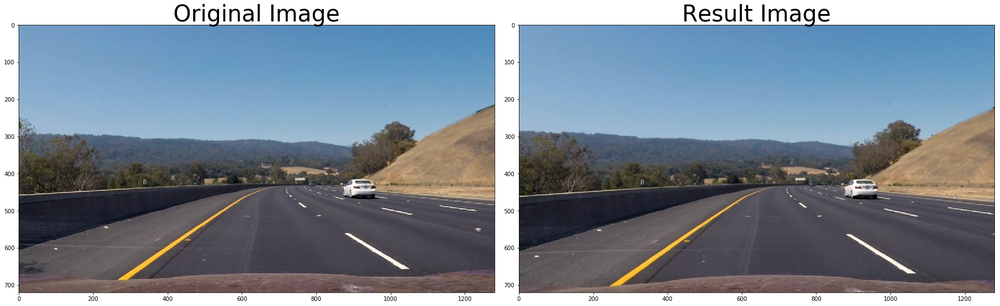

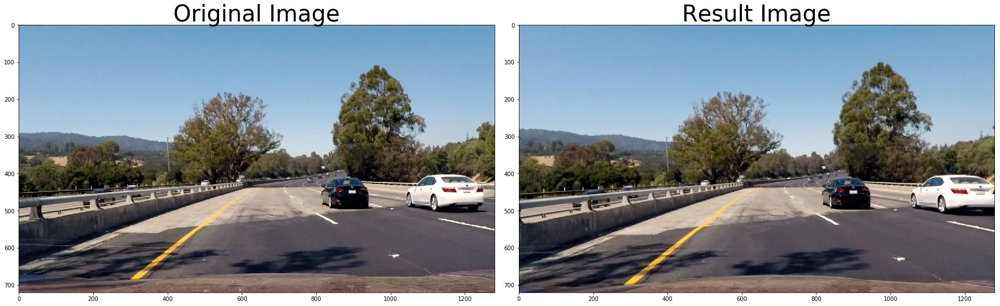

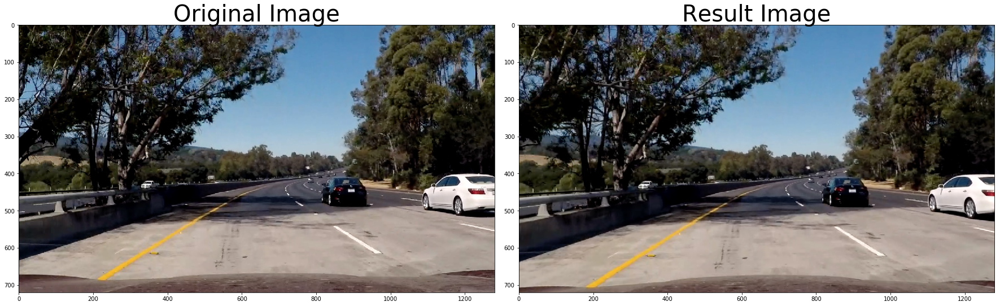

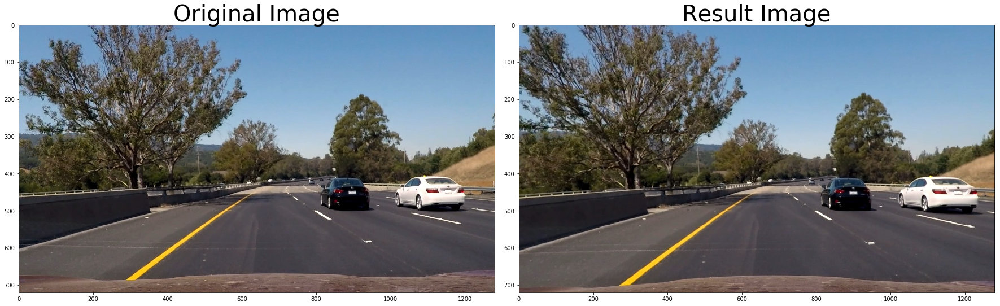

In [4]:
# Test 1:

# Calculate objpoints, imgpoints
chess_images = '../camera_cal/calibration*.jpg'
objpoints,imgpoints = calc_points(chess_images)

#read chessboard images
images = glob.glob(chess_images)
for img_name in images:
    img = mpimg.imread(img_name)
    dst_img = undistort_image(img,objpoints,imgpoints) 
    
    out_name = img_name.split('/')[2].split('.')[0]
    out_name = out_name + '_out.jpg'
    mpimg.imsave(out_name, dst_img)
    
  
# read test imgaes
images = glob.glob('../test_images/test*.jpg')
for img_name in images:
    img = mpimg.imread(img_name)
    dst_img = undistort_image(img,objpoints,imgpoints)
    plot_compare_color(img, dst_img)

## 3. Create a thresholded binary image

In [5]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1  
    
    return grad_binary

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):

    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    
    return dir_binary


# Gradient threshold combined
def grad_thres(image):

    # Choose a Sobel kernel size
    ksize = 3 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    #grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(0, 255))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 150))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))

    combined = np.zeros_like(dir_binary)
    #combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    combined[(gradx == 1) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return combined

In [6]:
#Combined color and gradient thresholding
def color_grad_thres(image, s_thresh=(170, 255), r_thres=(225,255)):
    
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    
    #threshold S color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    #threshold R color channel
    r_channel = image[:,:,0]
    r_binary = np.zeros_like(r_channel)
    r_binary[(r_channel > r_thres[0]) & (r_channel <= r_thres[1])] = 1
    
    #threshold grad,mag,dir channel
    grad_binary = grad_thres(image)
    
    #combine all thresholds together
    #result_binary = np.dstack(( np.zeros_like(grad_binary), grad_binary, s_binary, r_binary))
    result_binary = np.zeros_like(s_binary)
    #result_binary[(grad_binary == 1) | (s_binary == 1) | (r_binary == 1)] = 1
    #result_binary[(grad_binary == 1)] = 1
    result_binary[(grad_binary == 1) | (r_binary == 1)] = 1

    return result_binary

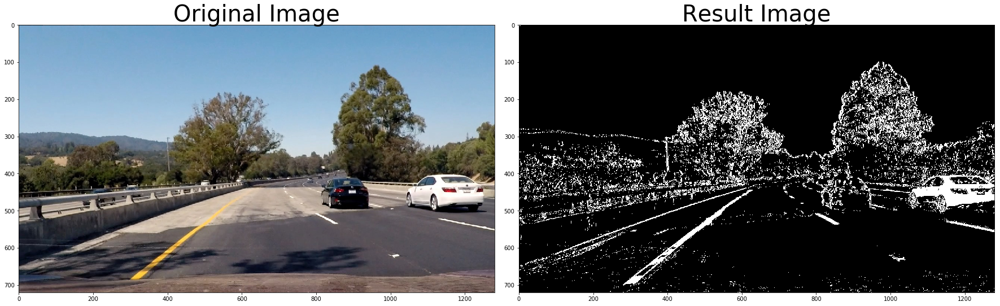

In [7]:
# Test 2:

img_name = '../test_images/test4.jpg'
img = mpimg.imread(img_name)
dst_img = undistort_image(img,objpoints,imgpoints)


thres_img = color_grad_thres(dst_img)
mpimg.imsave('test1_out.jpg', thres_img)
plot_compare_black(img, thres_img)

## 4. Apply a perspective transform

(720, 1280, 3)


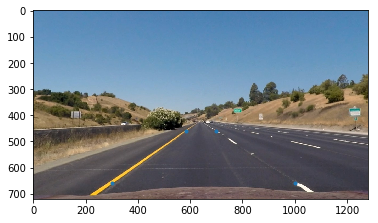

In [8]:
# Visualize hard-coded points

img_name = '../test_images/straight_lines1.jpg'
img = mpimg.imread(img_name)
dst_img = undistort_image(img,objpoints,imgpoints)

img_size = dst_img.shape
print(img_size)

srcp = np.float32([[300.47,658.238],[584.888,459.251],[697.796,459.251],[1001.77,658.238]])
dstp = np.float32([[300.47,658.238],[300.47,0],[1001.77,0],[1001.77,658.238]])

implot = plt.imshow(dst_img)
plt.plot(srcp[:,0],srcp[:,1],'.')
plt.show()


In [9]:
def persp_trans(image, srcp, dstp):

    M = cv2.getPerspectiveTransform(srcp,dstp)
    img_size = (image.shape[1], image.shape[0])
    warped = cv2.warpPerspective(image,M,img_size,flags=cv2.INTER_LINEAR)
    
    return warped, M

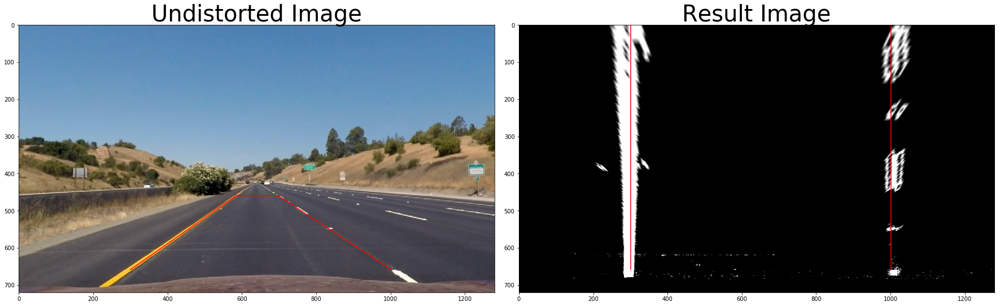

In [10]:
# Test 3:
        
img_name = '../test_images/straight_lines1.jpg'
img = mpimg.imread(img_name)
dst_img = undistort_image(img,objpoints,imgpoints)
thres_img = color_grad_thres(dst_img)

bird_img,persp_M = persp_trans(thres_img, srcp, dstp)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(dst_img, cmap = 'gray')
ax1.set_title('Undistorted Image', fontsize=40)
ax1.plot(srcp[:,0], srcp[:,1], 'r-')

ax2.imshow(bird_img, cmap = 'gray')
ax2.plot(dstp[:2,0], dstp[:2,1], 'r-')
ax2.plot(dstp[2:4,0], dstp[2:4,1], 'r-')
ax2.set_title('Result Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [11]:
chess_images = '../camera_cal/calibration*.jpg'
objpoints,imgpoints = calc_points(chess_images)

In [12]:
img.shape[1]/2

640.0

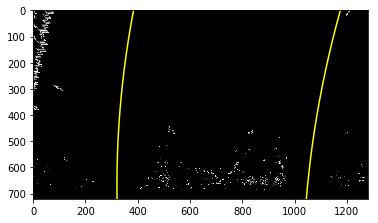

In [13]:
import sliding_windows as sw
importlib.reload(sw)

img_name = '../test_images/test1.jpg'
img = mpimg.imread(img_name)
dst_img = undistort_image(img,objpoints,imgpoints)
thres_img = color_grad_thres(dst_img)

srcp = np.float32([[300.47,658.238],[584.888,459.251],[697.796,459.251],[1001.77,658.238]])
dstp = np.float32([[300.47,658.238],[300.47,0],[1001.77,0],[1001.77,658.238]])

bird_img,persp_M = persp_trans(thres_img, srcp, dstp)
left_c, right_c, left_fitx, right_fitx, ploty, offset = sw.sliding_windows(bird_img, plot = True)

## 5. Finding lines & measuring curvatures

In [14]:
import sliding_windows as sw
importlib.reload(sw)

def plot_img(bird_img, img, persp_M, left_c, right_c, left_fitx, right_fitx, ploty, offset):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(bird_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    Minv = np.linalg.inv(persp_M)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 

    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    words = 'Left curvature: ' + str(round(left_c,3)) +  'm' + \
            '  Right curvature: ' + str(round(right_c,3)) + 'm' + \
            '  Center offset: ' + str(round(offset,3)) + 'm'
    cv2.putText(result,words,(10,50), font, 0.7,(255,255,255),2)
    
    return result

## 6. Pipeline(image) 

In [15]:
# Test 4:

# Calculate objpoints, imgpoints
chess_images = '../camera_cal/calibration*.jpg'
objpoints,imgpoints = calc_points(chess_images)

# read test imgaes
images = glob.glob('../test_images/test*.jpg')
for img_name in images:
    print(img_name)
    img = mpimg.imread(img_name)
    dst_img = undistort_image(img,objpoints,imgpoints)
    thres_img = color_grad_thres(dst_img)
    
    srcp = np.float32([[300.47,658.238],[584.888,459.251],[697.796,459.251],[1001.77,658.238]])
    dstp = np.float32([[300.47,658.238],[300.47,0],[1001.77,0],[1001.77,658.238]])
    
    bird_img,persp_M = persp_trans(thres_img, srcp, dstp)
    left_c, right_c, left_fitx, right_fitx, ploty, offset = sw.sliding_windows(bird_img, plot = False)
    
    out_name = img_name.split('/')[2].split('.')[0]
    out_name = out_name + '_out.jpg'
    out_img = plot_img(bird_img, dst_img, persp_M, left_c, right_c, left_fitx, right_fitx, ploty, offset)
    mpimg.imsave(out_name, out_img)
    

../test_images/test1.jpg
../test_images/test2.jpg
../test_images/test3.jpg
../test_images/test4.jpg
../test_images/test5.jpg
../test_images/test6.jpg


## 7. Pipeline(video) 

In [16]:
class Line():
    def __init__(self):

        self.detected = False 
        self.quality = False      
        
        self.left_fit = []
        self.right_fit = []
        
        self.left_fit_recent = None
        self.right_fit_recent = None
        
        self.left_fitx = None
        self.right_fitx = None
        
        self.left_diff = None
        self.right_diff = None
        
        self.left_basex = None
        self.left_basey = None
        
        self.right_basex = None
        self.right_basey = None
        
        self.left_max_y = 0
        self.right_max_y = 0


In [17]:
def find_line_inds_without_info(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)

    # Create an output image to draw on and visualize the result
    #out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 6

    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 50
    # Set minimum number of pixels found to recenter window
    minpix = 30
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & \
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & \
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    return left_lane_inds, right_lane_inds

In [25]:
from numpy import linalg as LA

def sliding_windows_v2(binary_warped, line=None):
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    if (not line.detected) or (not line.quality):
        left_lane_inds, right_lane_inds = find_line_inds_without_info(binary_warped)         
        
    else:  
        margin = 50
        left_lane_inds = ((nonzerox > (line.left_fit_recent[0]*(nonzeroy**2) + \
                                       line.left_fit_recent[1]*nonzeroy + line.left_fit_recent[2] - margin)) & \
                          (nonzerox < (line.left_fit_recent[0]*(nonzeroy**2) + \
                                       line.left_fit_recent[1]*nonzeroy + line.left_fit_recent[2] + margin)))         
        right_lane_inds = ((nonzerox > (line.right_fit_recent[0]*(nonzeroy**2) + \
                                        line.right_fit_recent[1]*nonzeroy + line.right_fit_recent[2] - margin)) & \
                           (nonzerox < (line.right_fit_recent[0]*(nonzeroy**2) + \
                                        line.right_fit_recent[1]*nonzeroy + line.right_fit_recent[2] + margin))) 

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    left_max_y = np.max(lefty)
    left_basey_inds = np.where(lefty == left_max_y)
    left_basex = itemgetter(*left_basey_inds)(leftx)
    left_basey = itemgetter(*left_basey_inds)(lefty)
    
    right_max_y = np.max(righty)
    right_basey_inds = np.where(righty == right_max_y)
    right_basex = itemgetter(*right_basey_inds)(rightx)
    right_basey = itemgetter(*right_basey_inds)(righty)
    
    #if line.detected and line.quality:
    if line.detected:
        leftx = np.append(leftx,line.left_basex)
        lefty = np.append(lefty,line.left_basey)    
        rightx = np.append(rightx,line.right_basex)
        righty = np.append(righty,line.right_basey)
                   

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
    # Smoothing
    if line.detected and line.quality:
        line.left_diff = LA.norm(left_fit - line.left_fit_recent)
        line.right_diff = LA.norm(right_fit - line.right_fit_recent)
        
        if line.left_diff <=5 and line.right_diff <=5:   
            temp_left = line.left_fit[:]
            temp_left.append(left_fit.tolist())
            left_fit_smooth = np.mean( np.array(temp_left), axis=0)
            left_fitx = left_fit_smooth[0]*ploty**2 + left_fit_smooth[1]*ploty + left_fit_smooth[2]
            
            temp_right = line.right_fit[:]
            temp_right.append(right_fit.tolist())
            right_fit_smooth = np.mean( np.array(temp_right), axis=0)       
            right_fitx = right_fit_smooth[0]*ploty**2 + right_fit_smooth[1]*ploty + right_fit_smooth[2]
            
        elif line.left_diff <=5:
            temp_left = line.left_fit[:]
            temp_left.append(left_fit.tolist())
            left_fit_smooth = np.mean( np.array(temp_left), axis=0)
            left_fitx = left_fit_smooth[0]*ploty**2 + left_fit_smooth[1]*ploty + left_fit_smooth[2]
            
            temp_right = line.right_fit[:]
            right_fit_smooth = np.mean( np.array(temp_right), axis=0)       
            right_fitx = right_fit_smooth[0]*ploty**2 + right_fit_smooth[1]*ploty + right_fit_smooth[2]
            
        elif line.right_diff <=5:
            temp_left = line.left_fit[:]
            left_fit_smooth = np.mean( np.array(temp_left), axis=0)
            left_fitx = left_fit_smooth[0]*ploty**2 + left_fit_smooth[1]*ploty + left_fit_smooth[2]
            
            temp_right = line.right_fit[:]
            temp_right.append(right_fit.tolist())
            right_fit_smooth = np.mean( np.array(temp_right), axis=0)       
            right_fitx = right_fit_smooth[0]*ploty**2 + right_fit_smooth[1]*ploty + right_fit_smooth[2]
            
        else:
            temp_left = line.left_fit[:]
            left_fit_smooth = np.mean( np.array(temp_left), axis=0)
            left_fitx = left_fit_smooth[0]*ploty**2 + left_fit_smooth[1]*ploty + left_fit_smooth[2]
            
            temp_right = line.right_fit[:]
            right_fit_smooth = np.mean( np.array(temp_right), axis=0)       
            right_fitx = right_fit_smooth[0]*ploty**2 + right_fit_smooth[1]*ploty + right_fit_smooth[2]
        
    else:
        line.left_diff = 0
        line.right_diff = 0
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
#     if not line.detected:
#         line.left_diff = 0
#         line.right_diff = 0
#     else:
#         line.left_diff = LA.norm(left_fit - line.left_fit_recent)
#         line.right_diff = LA.norm(right_fit - line.right_fit_recent)
        
#     left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#     right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
    # Calculate center offset
    center_offset = abs((left_fitx[-1] + right_fitx[-1])/2 - 640.0)   

    y_eval = np.max(ploty)
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space   
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curvated = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / \
                    np.absolute(2*left_fit_cr[0])
    right_curvated = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / \
                    np.absolute(2*right_fit_cr[0]) 
    
    if line.detected:
        left_cur_diff = abs(left_curvated - line.curvature[0])
        right_cur_diff = abs(right_curvated - line.curvature[1])
    else:
        left_cur_diff = 0
        right_cur_diff = 0

        
    #### Update Info
    
    line.left_fitx = left_fitx
    line.right_fitx = right_fitx
    
    
    if left_max_y > line.left_max_y:
        line.left_basex = left_basex
        line.left_basey = left_basey
    if right_max_y > line.right_max_y:
        line.right_basex = right_basex
        line.right_basey = right_basey
    
    # define line quality
    if left_curvated < 350 or right_curvated < 350 or \
       left_cur_diff > 500 or right_cur_diff > 500 or \
        line.left_diff > 5 or line.right_diff > 5:
        line.quality = False
    else:
        line.quality = True        
    
    line.detected = True
    
    if left_curvated >= 350 and line.quality == True:
        line.left_fit.append(left_fit.tolist())
        if len(line.left_fit) == 4:
            del line.left_fit[0]            
        
    line.left_fit_recent = left_fit
    
        
    if right_curvated >= 350 and line.quality == True:
        line.right_fit.append(right_fit.tolist())
        if len(line.right_fit) == 4:
            del line.right_fit[0]           
        
    line.right_fit_recent = right_fit
    
    line.curvature = (left_curvated,right_curvated) 
    center_offset = center_offset * xm_per_pix
    
    return left_curvated, right_curvated, left_fitx, right_fitx, ploty, line, center_offset

In [19]:
# from numpy import linalg as LA

# def sliding_windows_v2(binary_warped, line=None):
    
#     nonzero = binary_warped.nonzero()
#     nonzeroy = np.array(nonzero[0])
#     nonzerox = np.array(nonzero[1])
    
#     if (not line.detected) or (not line.quality):
#         left_lane_inds, right_lane_inds = find_line_inds_without_info(binary_warped)         
        
#     else:  
#         margin = 50
#         left_lane_inds = ((nonzerox > (line.left_fit_recent[0]*(nonzeroy**2) + \
#                                        line.left_fit_recent[1]*nonzeroy + line.left_fit_recent[2] - margin)) & \
#                           (nonzerox < (line.left_fit_recent[0]*(nonzeroy**2) + \
#                                        line.left_fit_recent[1]*nonzeroy + line.left_fit_recent[2] + margin)))         
#         right_lane_inds = ((nonzerox > (line.right_fit_recent[0]*(nonzeroy**2) + \
#                                         line.right_fit_recent[1]*nonzeroy + line.right_fit_recent[2] - margin)) & \
#                            (nonzerox < (line.right_fit_recent[0]*(nonzeroy**2) + \
#                                         line.right_fit_recent[1]*nonzeroy + line.right_fit_recent[2] + margin))) 

#     # Extract left and right line pixel positions
#     leftx = nonzerox[left_lane_inds]
#     lefty = nonzeroy[left_lane_inds] 
#     rightx = nonzerox[right_lane_inds]
#     righty = nonzeroy[right_lane_inds] 
    
#     left_max_y = np.max(lefty)
#     left_basey_inds = np.where(lefty == left_max_y)
#     left_basex = itemgetter(*left_basey_inds)(leftx)
#     left_basey = itemgetter(*left_basey_inds)(lefty)
    
#     right_max_y = np.max(righty)
#     right_basey_inds = np.where(righty == right_max_y)
#     right_basex = itemgetter(*right_basey_inds)(rightx)
#     right_basey = itemgetter(*right_basey_inds)(righty)
    
#     if line.detected and line.quality:
#         leftx = np.append(leftx,line.left_basex)
#         lefty = np.append(lefty,line.left_basey)    
#         rightx = np.append(rightx,line.right_basex)
#         righty = np.append(righty,line.right_basey)
                   

#     # Fit a second order polynomial to each
#     left_fit = np.polyfit(lefty, leftx, 2)
#     right_fit = np.polyfit(righty, rightx, 2)
    
#     # Generate x and y values for plotting
#     ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
#     # Smoothing
#     if line.detected and line.quality:
#         line.left_diff = LA.norm(left_fit - line.left_fit_recent)
#         line.right_diff = LA.norm(right_fit - line.right_fit_recent)
        
#         if line.left_diff <=5 and line.right_diff <=5:   
#             temp_left = line.left_fit[:]
#             temp_left.append(left_fit.tolist())
#             left_fit_smooth = np.mean( np.array(temp_left), axis=0)
#             left_fitx = left_fit_smooth[0]*ploty**2 + left_fit_smooth[1]*ploty + left_fit_smooth[2]
            
#             temp_right = line.right_fit[:]
#             temp_right.append(right_fit.tolist())
#             right_fit_smooth = np.mean( np.array(temp_right), axis=0)       
#             right_fitx = right_fit_smooth[0]*ploty**2 + right_fit_smooth[1]*ploty + right_fit_smooth[2]
            
#         elif line.left_diff <=5:
#             temp_left = line.left_fit[:]
#             temp_left.append(left_fit.tolist())
#             left_fit_smooth = np.mean( np.array(temp_left), axis=0)
#             left_fitx = left_fit_smooth[0]*ploty**2 + left_fit_smooth[1]*ploty + left_fit_smooth[2]
#             right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
            
#         elif line.right_diff <=5:
#             left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#             temp_right = line.right_fit[:]
#             temp_right.append(right_fit.tolist())
#             right_fit_smooth = np.mean( np.array(temp_right), axis=0)       
#             right_fitx = right_fit_smooth[0]*ploty**2 + right_fit_smooth[1]*ploty + right_fit_smooth[2]
            
#         else:
#             #left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#             #right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2] 
#             left_fitx = line.left_fitx
#             right_fitx = line.right_fitx
        
#     else:
#         line.left_diff = 0
#         line.right_diff = 0
#         left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#         right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
#     # Calculate center offset
#     #left_fitx0 = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#     #right_fitx0 = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
#     center_offset = abs((left_fitx[-1] + right_fitx[-1])/2 - 640.0)   

#     y_eval = np.max(ploty)
#     ym_per_pix = 30/720 # meters per pixel in y dimension
#     xm_per_pix = 3.7/700 # meters per pixel in x dimension

#     # Fit new polynomials to x,y in world space   
#     left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
#     right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
#     # Calculate the new radii of curvature
#     left_curvated = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / \
#                     np.absolute(2*left_fit_cr[0])
#     right_curvated = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / \
#                     np.absolute(2*right_fit_cr[0]) 
    
#     if line.detected:
#         left_cur_diff = abs(left_curvated - line.curvature[0])
#         right_cur_diff = abs(right_curvated - line.curvature[1])
#     else:
#         left_cur_diff = 0
#         right_cur_diff = 0

        
#     #### Update Info
    
#     line.left_fitx = left_fitx
#     line.right_fitx = right_fitx
    
    
#     if left_max_y > line.left_max_y:
#         line.left_basex = left_basex
#         line.left_basey = left_basey
#     if right_max_y > line.right_max_y:
#         line.right_basex = right_basex
#         line.right_basey = right_basey
            
#     if left_curvated < 350 or right_curvated < 350 or \
#        left_cur_diff > 500 or right_cur_diff > 500 or \
#         line.left_diff > 8 or line.right_diff > 8:
#         line.quality = False
#     else:
#         line.quality = True        
    
#     line.detected = True
    
#     if left_curvated >= 350 and line.quality == True:
#         line.left_fit.append(left_fit.tolist())
#         if len(line.left_fit) == 3:
#             del line.left_fit[0]            
#         line.left_fit_recent = left_fit
    
        
#     if right_curvated >= 350 and line.quality == True:
#         line.right_fit.append(right_fit.tolist())
#         if len(line.right_fit) == 4:
#             del line.right_fit[0]           
#         line.right_fit_recent = right_fit
    
#     line.curvature = (left_curvated,right_curvated) 
#     center_offset = center_offset * xm_per_pix
    
#     return left_curvated, right_curvated, left_fitx, right_fitx, ploty, line, center_offset

## 6. Build up pipeline

In [26]:
LINE_OBJ = Line()

chess_images = '../camera_cal/calibration*.jpg'
objpoints,imgpoints = calc_points(chess_images)

def process_image(image):
    global objpoints
    global imgpoints
    
    dst_img = undistort_image(image,objpoints,imgpoints)
    thres_img = color_grad_thres(dst_img)
    
    srcp = np.float32([[300.47,658.238],[584.888,459.251],[697.796,459.251],[1001.77,658.238]])
    dstp = np.float32([[300.47,658.238],[300.47,0],[1001.77,0],[1001.77,658.238]])
    
    bird_img,persp_M = persp_trans(thres_img, srcp, dstp)
    global LINE_OBJ
    left_c, right_c, left_fitx, right_fitx, ploty, LINE_OBJ, offset = \
                                                        sliding_windows_v2(bird_img, line=LINE_OBJ)
    result = plot_img(bird_img, dst_img, persp_M, left_c, right_c, left_fitx, right_fitx, ploty, offset)
    
    return result

In [27]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

white_output = 'project_video_out.mp4'
clip1 = VideoFileClip("project_video.mp4")


white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [07:19<00:00,  2.86it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 7min 6s, sys: 1min 43s, total: 8min 50s
Wall time: 7min 19s


In [22]:
# This cell is for debugging purpose

# from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip
# ffmpeg_extract_subclip("project_video.mp4", 10, 15, targetname="test.mp4")

# vidcap = cv2.VideoCapture('test1.mp4')
# success,image = vidcap.read()
# count = 0
# success = True
# while success:
#     success,image = vidcap.read()
#     cv2.imwrite("video_test/frame%d.jpg" % count, image)     # save frame as JPEG file
#     count += 1


In [23]:
# # Check the challenge video
# from moviepy.editor import VideoFileClip
# from IPython.display import HTML

# white_output = 'challenge_video_out.mp4'
# clip1 = VideoFileClip("challenge_video.mp4")

# # white_output = 'test_out.mp4'
# # clip1 = VideoFileClip("test.mp4")
# white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
# %time white_clip.write_videofile(white_output, audio=False)

In [24]:
# from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip
#ffmpeg_extract_subclip("project_video.mp4", 36, 49, targetname="test2.mp4")
#ffmpeg_extract_subclip("project_video.mp4", 22, 25, targetname="test1.mp4")